## Hacer pruebas:

In [43]:
from skimage.measure import find_contours
import matplotlib.pyplot as plt
import numpy as np
from torchviz import make_dot
import torch
import cv2


In [44]:
# Mi libreria:
%load_ext autoreload
%autoreload 2
from processLIDC import Patient

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


obteniendo los datos...
realizando inferencia...


RuntimeError: The following operation failed in the TorchScript interpreter.
Traceback of TorchScript, serialized code (most recent call last):
  File "code/__torch__/unet.py", line 36, in forward
    encoder4 = self.encoder4
    pool3 = self.pool3
    enc4 = (encoder4).forward((pool3).forward(enc3, ), )
            ~~~~~~~~~~~~~~~~~ <--- HERE
    bottleneck = self.bottleneck
    pool4 = self.pool4
  File "code/__torch__/torch/nn/modules/container/___torch_mangle_12.py", line 23, in forward
    input1 = (enc4norm1).forward(input0, )
    input2 = (enc4relu1).forward(input1, )
    input3 = (enc4conv2).forward(input2, )
              ~~~~~~~~~~~~~~~~~~ <--- HERE
    input4 = (enc4norm2).forward(input3, )
    return (enc4relu2).forward(input4, )
  File "code/__torch__/torch/nn/modules/conv/___torch_mangle_11.py", line 23, in forward
    weight = self.weight
    bias = self.bias
    _0 = (self)._conv_forward(input, weight, bias, )
          ~~~~~~~~~~~~~~~~~~~ <--- HERE
    return _0
  def _conv_forward(self: __torch__.torch.nn.modules.conv.___torch_mangle_11.Conv2d,
  File "code/__torch__/torch/nn/modules/conv/___torch_mangle_11.py", line 29, in _conv_forward
    weight: Tensor,
    bias: Optional[Tensor]) -> Tensor:
    _1 = torch.conv2d(input, weight, bias, [1, 1], [1, 1], [1, 1])
         ~~~~~~~~~~~~ <--- HERE
    return _1

Traceback of TorchScript, original code (most recent call last):
  File "/home/faraujo/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master/unet.py", line 49, in forward
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
               ~~~~~~~~~~~~~ <--- HERE
    
        bottleneck = self.bottleneck(self.pool4(enc4))
  File "/home/faraujo/anaconda3/lib/python3.9/site-packages/torch/nn/modules/container.py", line 141, in forward
    def forward(self, input):
        for module in self:
            input = module(input)
                    ~~~~~~ <--- HERE
        return input
  File "/home/faraujo/anaconda3/lib/python3.9/site-packages/torch/nn/modules/conv.py", line 447, in forward
    def forward(self, input: Tensor) -> Tensor:
        return self._conv_forward(input, self.weight, self.bias)
               ~~~~~~~~~~~~~~~~~~ <--- HERE
  File "/home/faraujo/anaconda3/lib/python3.9/site-packages/torch/nn/modules/conv.py", line 443, in _conv_forward
                            weight, bias, self.stride,
                            _pair(0), self.dilation, self.groups)
        return F.conv2d(input, weight, bias, self.stride,
               ~~~~~~~~ <--- HERE
                        self.padding, self.dilation, self.groups)
RuntimeError: CUDA out of memory. Tried to allocate 12.00 MiB (GPU 0; 3.82 GiB total capacity; 878.78 MiB already allocated; 59.88 MiB free; 894.00 MiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF


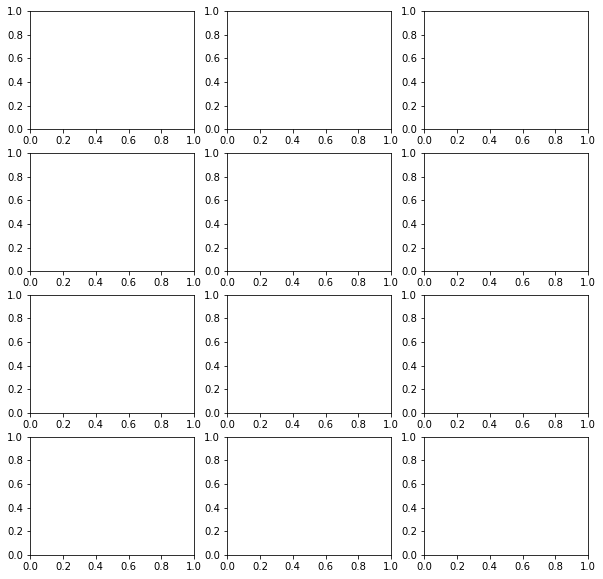

In [65]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#                        in_channels=3, out_channels=1, init_features=32, pretrained=True)
model = torch.jit.load('model_scripted.pt')
model.eval()
patient = Patient("LIDC-IDRI-0002")
patient.scale()
patient.imshow(slices=(171,172,173,174,175,176,177,178,179,180,181,182),
               scaled=True, 
               label=True, 
               model=model, 
               path2save=None)

In [46]:
patient = Patient("LIDC-IDRI-0002")

In [47]:
metodos = [m for m in dir(patient) if not '__' in m]
print(metodos) 

['get_all_nodules', 'get_mask', 'get_tensors', 'id_patient', 'imgs_scaled', 'imshow', 'mask', 'plot_mask', 'predict', 'reconstruct_body', 'scale', 'scan', 'vol']


In [48]:
patient.get_all_nodules()

Paciente: LIDC-IDRI-0002
___________________________________
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 171
num. slices nodulo: 28
-----------
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 176
num. slices nodulo: 23
-----------
___________________________________


In [49]:
patient.plot_mask()

In [50]:
patient.reconstruct_body(nodulos = True)

117735


In [51]:
params = {'slices': (120,121,122,123), # (180, 185, 190)
          'plot': True,
          'with_mask': True}

patient.scale()

obteniendo los datos...


/home/faraujo/TFM/processLIDC/app/processLIDC.py:236: UserWarning:

No contour levels were found within the data range.

No handles with labels found to put in legend.


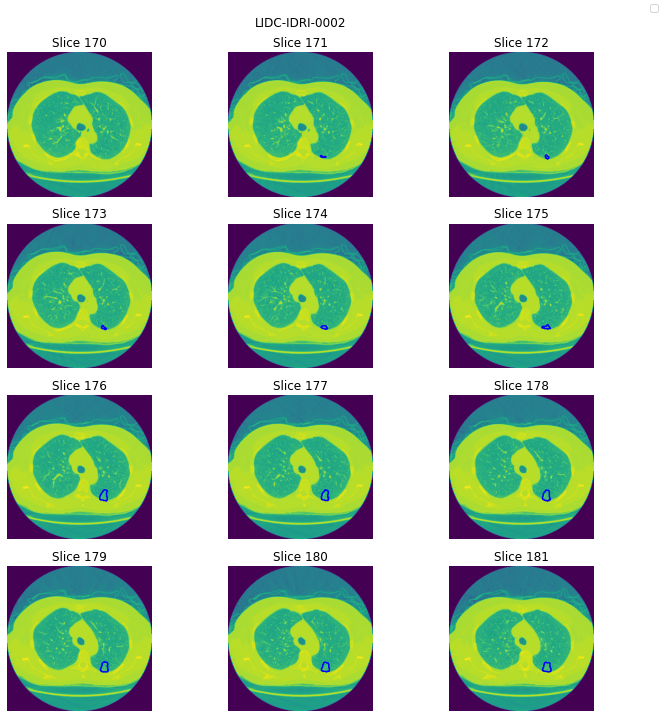

In [52]:
# Mostrar imagenes:

patient.imshow(slices=(170,171,172,173,174,175,176,177,178,179,180,181), scaled=True)

## Inferencia:

In [53]:
# Mi libreria:
%load_ext autoreload
%autoreload 2
from processLIDC import Patient
import torch

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Using cache found in /home/faraujo/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


obteniendo los datos...
realizando inferencia...


No handles with labels found to put in legend.


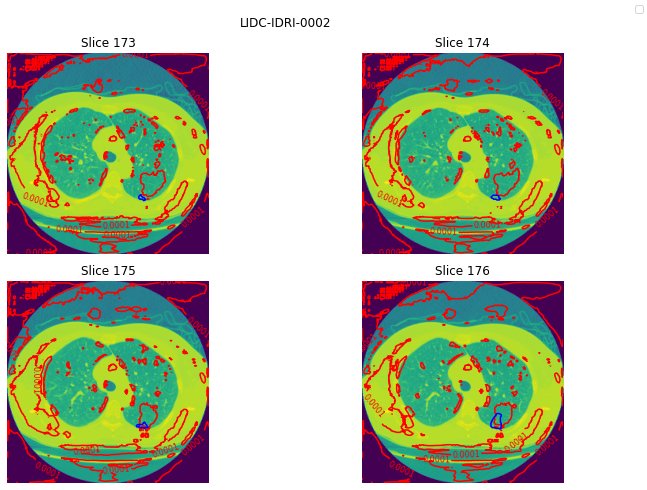

In [54]:
## Partiendo de la estructura de la red, cargamos el state:
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                       in_channels=3, out_channels=1, init_features=32, pretrained=True)
model.load_state_dict(torch.load('model-epoch9.pth'))
model.to('cuda') # # Si fue entrenado en grafica hay que abrirlo con tal 

# Cargar modelos sin saber la estructura:
model = torch.jit.load('finalmodel22_00.pt')
model.to('cuda') # # Si fue entrenado en grafica hay que abrirlo con tal 
model.eval()



patient = Patient("LIDC-IDRI-0002")
patient.scale()
patient.imshow(slices=(173,174,175,176),
               scaled=True, 
               label=True, 
               model=model,
               thresholds = (0.0001, ),
               path2save=None,
               gpu = True)

## Inferencia fuera de la clase Patient (mas laboriosa).

Vale para sacar el graphviz del modelo

In [55]:
# # vuelvo a instanciar:
# patient = Patient("LIDC-IDRI-0002")
# patient.scale()

1. Descargar el modelo, UNET. Entrenada con imagenes del cerebro.

In [56]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#                        in_channels=3, out_channels=1, init_features=32, pretrained=True)

Inspeccionemos el modelo:

In [57]:
# print(model)
# print(dir(model))

2. Obtener los tensores para pytorch (imagenes)

In [58]:
# imgs, mask = patient.get_tensors(scaled=True)

In [59]:
# print(imgs.shape)
# print(imgs[0].shape)

3. Seleccionar imagenes para hacer inferencia y hacerla:

In [60]:
# # slices:
# primera = 80
# ultima = 84

# # Predecir:
# pred = model(imgs[primera:ultima])

# # Aprovechamos para obtener un grafico de la red:
# graph = make_dot(pred, params=dict(model.named_parameters()))

# # # Si queremos guardarla en la carpeta
# # graph.render('model', format='png')

# # obtenemos la imagen:
# png_bytes = graph.pipe(format='png')
# # Decodifica los bytes de PNG en un objeto de imagen OpenCV
# nparr = np.frombuffer(png_bytes, np.uint8)
# imagen = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
# plt.imshow(imagen)
# plt.show()


# # graph.render('model', format='png')
# pred = torch.round(pred).detach().numpy()

In [61]:
# pred.shape

Veamos qué ha salido:

In [62]:
# plt.imshow(pred[0].reshape(256,-1))
# plt.show()

Es binaria la mascara predicha? Si, aunque preferiria un mapa de calor siendo proximo a 1 donde sea tumor y 0 donde no lo sea.

In [63]:
# h = pred[0].reshape(-1)
# plt.hist(h, bins = 100)
# plt.title('es binario??')
# plt.show()

In [64]:
# for k in range(ultima-primera):
    
#     fig, ax = plt.subplots(1, 1, figsize=(5, 5))
#     ax.imshow(imgs[k+primera, 0, :, :], cmap='gray')  # , alpha=0.5)

#     for c in find_contours(pred[k, 0, :, :].astype(float), 0.5):
#         plt.plot(c[:, 1], c[:, 0], '--k', label='Prediction')
#     # plt.savefig(f"slice_pred_{k}.png")
#     #  plt.close()